In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from chaosmagpy.model_utils import design_gauss, power_spectrum
from chaosmagpy.data_utils import timestamp
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from alberte_klara_lib import do_design, plot_map_three
from alberte_klara_lib import n_int_max, n_ext_max, theta_grid, phi_grid, get_gausscoeff_timetrend, radius_Earth
import os

from alberte_klara_lib import do_design, plot_map_three, plot_map_one, do_design_timetrend, radius_CMB

In [3]:
data_dst = "ready_oersted_data\oersted_dark_quiet_01.txt"   
data = pd.read_table(data_dst, delimiter = ",")
data

<>:1: SyntaxWarning: invalid escape sequence '\o'
<>:1: SyntaxWarning: invalid escape sequence '\o'
C:\Users\alber\AppData\Local\Temp\ipykernel_28064\4256967962.py:1: SyntaxWarning: invalid escape sequence '\o'
  data_dst = "ready_oersted_data\oersted_dark_quiet_01.txt"


,time_stamp,radius,colat,lon,B_r,B_theta,B_phi,X,Y,Z,dDst,Hp30,F,B_radius
0,365.006992,7180.803,50.2341,54.9296,-28603.82,-18163.59,1075.45,18163.59,1075.45,28603.82,2.996487,1.667000,33900.606381,-28603.82
1,365.007728,7186.130,46.5159,53.9068,-30550.60,-16673.85,1249.46,16673.85,1249.46,30550.60,2.943513,1.667000,34826.966340,-30550.60
2,365.008463,7191.209,42.8090,52.7860,-32216.11,-15188.50,1395.14,15188.50,1395.14,32216.11,2.890538,1.667000,35644.279925,-32216.11
3,365.009199,7196.020,39.1147,51.5381,-33619.02,-13736.31,1504.84,13736.31,1504.84,33619.02,2.837562,1.667000,36348.167239,-33619.02
4,365.009935,7200.546,35.4353,50.1227,-34779.32,-12348.43,1574.94,12348.43,1574.94,34779.32,2.784587,1.667000,36940.022457,-34779.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135243,729.712168,7145.608,10.1415,-55.9544,-40567.58,-1946.86,-2206.86,1946.86,-2206.86,40567.58,1.448154,1.877243,40674.181516,-40567.58
135244,729.712929,7138.737,13.3990,-67.1826,-40899.02,-2108.67,-2114.24,2108.67,-2114.24,40899.02,1.338456,1.852852,41007.881400,-40899.02
135245,729.713915,7129.789,18.0231,-75.5897,-41341.93,-2784.94,-2083.60,2784.94,-2083.60,41341.93,1.196605,1.821311,41487.979655,-41341.93
135246,729.714860,7121.185,22.6630,-80.5814,-41690.63,-3923.82,-1691.14,3923.82,-1691.14,41690.63,1.060429,1.791032,41909.007954,-41690.63


In [4]:
nm_static = (n_int_max + 1)**2 - 1 + (n_ext_max + 1)**2 - 1
n_obs = len(data)

# lhs and rhs of lst sq prb will have to be constructed bit by bit
# allocating these in memory
lhs = np.zeros((nm_static, nm_static)) # G.T@G
rhs = np.zeros((nm_static,)) # G.T@d

# taking 10k data point at a time (sub matrix, chunk of data, G_sub) - but still all model parameters
i = 0
while (i <= n_obs - 10*10**3):
    i10k = i + 10*10**3

    G_int = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_int_max)))
    print(G_int.shape)
    G_ext = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_ext_max, source = 'external')))
    G = np.hstack((G_int, G_ext))
    lhs += G.T@G

    d = np.hstack((data['B_radius'].iloc[i:i10k], data['B_theta'].iloc[i:i10k], data['B_phi'].iloc[i:i10k]))
    rhs += G.T@d
    i += 10*10**3

G_int = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_int_max)))
G_ext = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_ext_max, source = 'external')))
G = np.hstack((G_int, G_ext))
lhs += G.T@G

d = np.hstack((data['B_radius'].iloc[i:], data['B_theta'].iloc[i:], data['B_phi'].iloc[i:]))
rhs += G.T@d


m = np.linalg.solve(lhs, rhs)

m_int_static = m[:-((n_ext_max + 1)**2 - 1)]
m_ext_static = m[-((n_ext_max + 1)**2 - 1):]

np.savetxt(os.path.join('ready_oersted_data', 'int_model_static_parameters'), m_int_static)
np.savetxt(os.path.join('ready_oersted_data', 'ext_model_static_parameters'), m_ext_static)

(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)


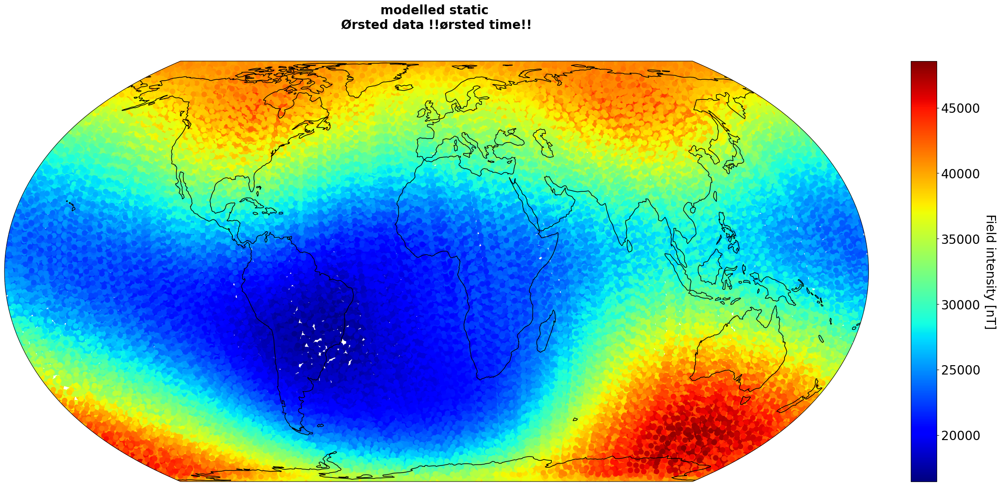

In [5]:
# Predicted field at Swarm altitude
G_pred_static_radius, G_pred_static_theta, G_pred_static_phi = do_design(data['radius'], data['colat'], data['lon'], n_int_max, n_ext_max)

b_pred_static_radius = G_pred_static_radius @ m
b_pred_static_theta = G_pred_static_theta @ m
b_pred_static_phi = G_pred_static_phi @ m

# field intensity
F_pred_static = np.sqrt(b_pred_static_radius**2 + b_pred_static_theta**2 + b_pred_static_phi**2)

plot_map_one(F_pred_static, data['lon'], data['colat'], sat='Ørsted', title='modelled static', label='Field intensity [nT]', scatter_size=80)

# Residuals between model-predicted field and measured field

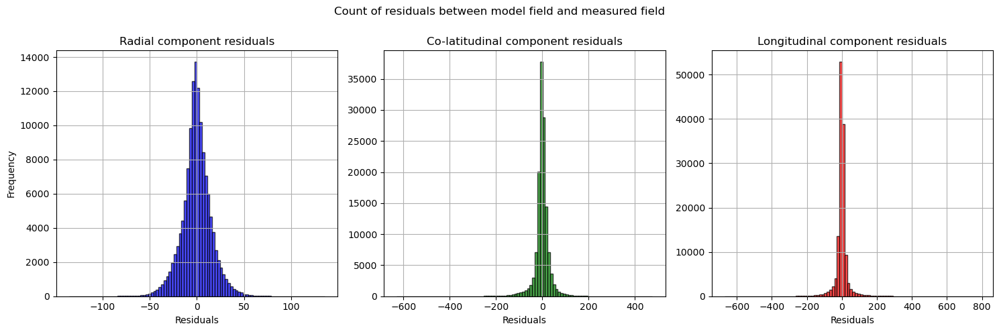

In [6]:
# Residuals
residuals_r_static = data['B_radius'] - b_pred_static_radius
residuals_t_static = data['B_theta'] - b_pred_static_theta
residuals_p_static = data['B_phi'] - b_pred_static_phi


# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals')
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
# axs[1].set_ylabel('Frequency')
axs[1].set_title('Co-latitudinal component residuals')
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
# axs[2].set_ylabel('Frequency')
axs[2].set_title('Longitudinal component residuals')
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Count of residuals between model field and measured field')

plt.show()

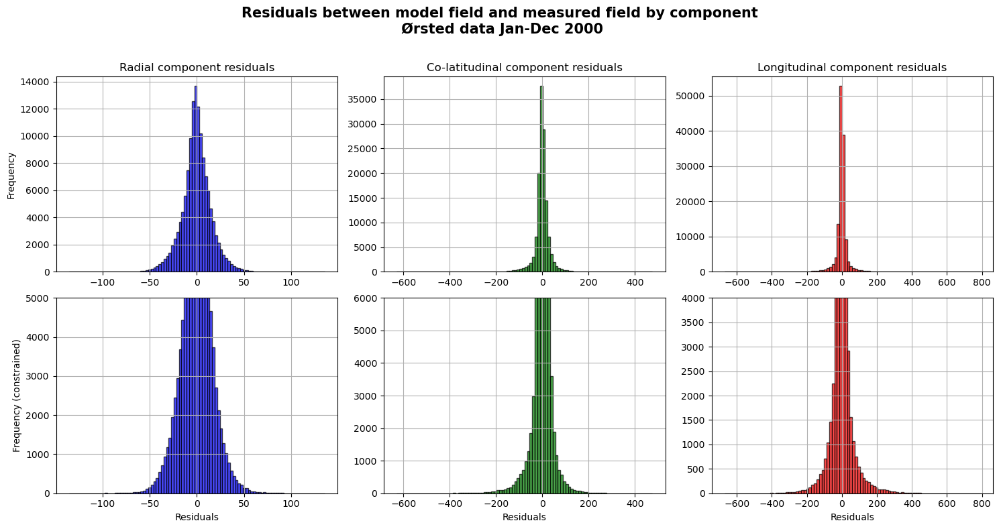

In [7]:
# Plot histogram of residuals
fig, axs = plt.subplots(2, 3, figsize=(15, 8))

# Plot histogram of residuals_r
axs[0, 0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].set_title('Radial component residuals')
axs[0, 0].grid(True)

# Plot histogram of residuals_t
axs[0, 1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[0, 1].set_title('Co-latitudinal component residuals')
axs[0, 1].grid(True)

# Plot histogram of residuals_p
axs[0, 2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[0, 2].set_title('Longitudinal component residuals')
axs[0, 2].grid(True)

# Plot histogram of residuals_r (constrained)
axs[1, 0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[1, 0].set_xlabel('Residuals')
axs[1, 0].set_ylabel('Frequency (constrained)')
axs[1, 0].set_ylim(0, 5000)
axs[1, 0].grid(True)

# Plot histogram of residuals_t (constrained)
axs[1, 1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1, 1].set_xlabel('Residuals')
axs[1, 1].set_ylim(0, 6000)
axs[1, 1].grid(True)

# Plot histogram of residuals_p (constrained)
axs[1, 2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[1, 2].set_xlabel('Residuals')
axs[1, 2].set_ylim(0, 4000)
axs[1, 2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Residuals between model field and measured field by component\n Ørsted data Jan-Dec 2000', weight = 'bold', fontsize = 15)

plt.show()

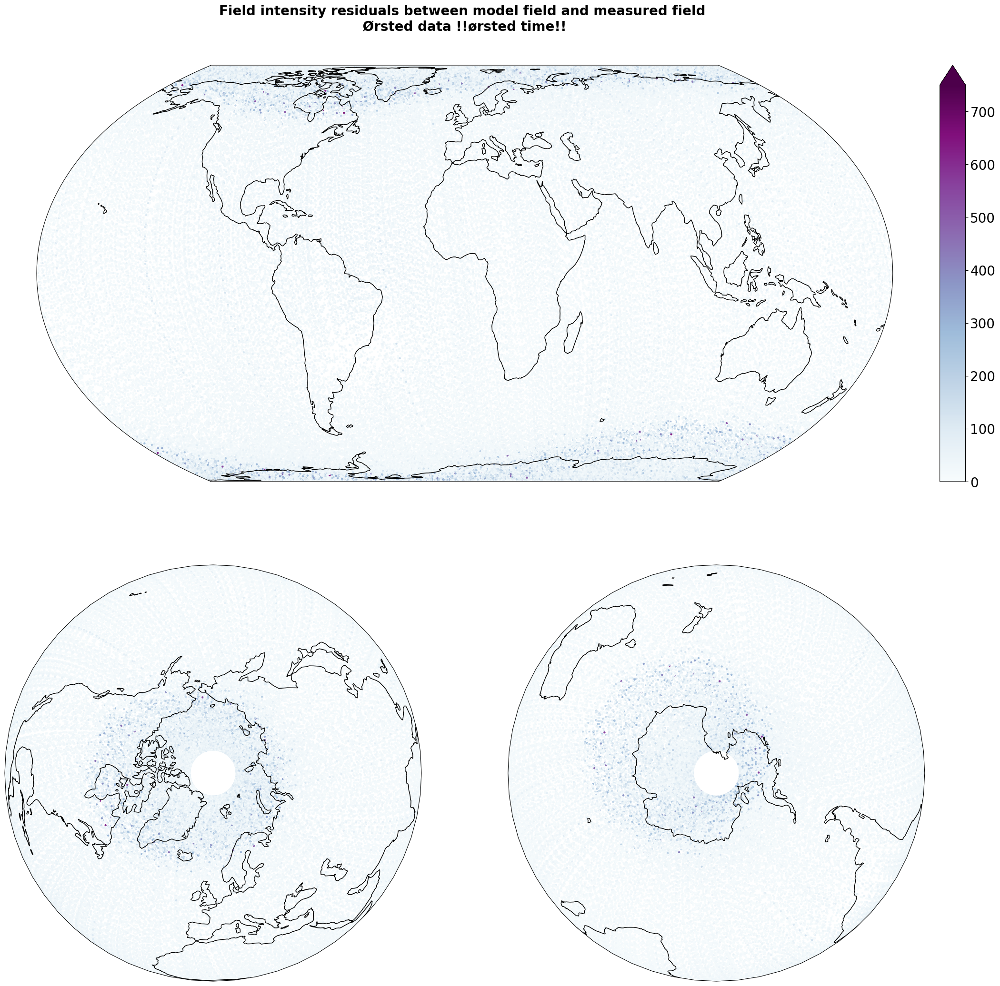

In [8]:
# Intensity of residuals on map
F_residuals = np.sqrt(residuals_r_static**2 + residuals_t_static**2 + residuals_p_static**2)

plot_map_three(F_residuals, data['lon'], data['colat'], 'Oersted', 'Field intensity residuals between model field and measured field', 'Residuals [nT]', scatter_size = 10, clim=[0, 750], colors='BuPu')

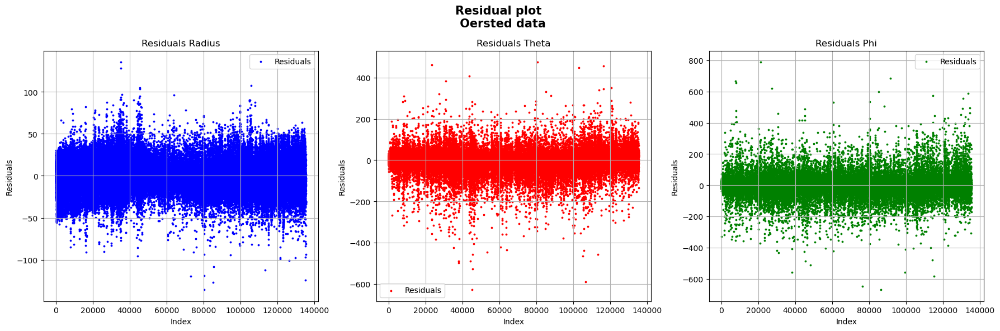

In [9]:
# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot residuals radius
axs[0].scatter(range(len(residuals_r_static)), residuals_r_static, color='blue', label='Residuals', s=3)
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Residuals')
axs[0].set_title('Residuals Radius')
axs[0].grid(True)
axs[0].legend()

# Plot residuals theta
axs[1].scatter(range(len(residuals_t_static)), residuals_t_static, color='red', label='Residuals', s=3)
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Residuals')
axs[1].set_title('Residuals Theta')
axs[1].grid(True)
axs[1].legend()

# Plot residuals phi
axs[2].scatter(range(len(residuals_p_static)), residuals_p_static, color='green', label='Residuals', s=3)
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Residuals')
axs[2].set_title('Residuals Phi')
axs[2].grid(True)
axs[2].legend()

fig.suptitle('Residual plot \n Oersted data', weight = 'bold', fontsize = 15)

plt.tight_layout()
plt.show()

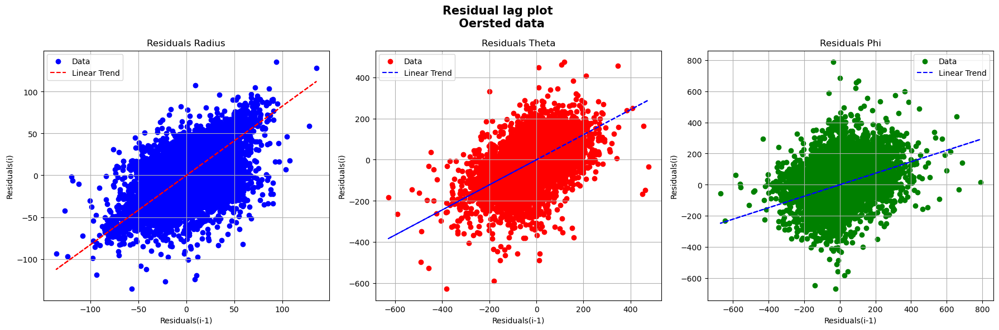

In [10]:
# Initialize lists to store residuals(i-1) and residuals(i)
residuals_r_i_minus_1 = []
residuals_r_i = []

# Iterate over the residuals data to populate the lists
for i in range(1, len(residuals_r_static)):
    residuals_r_i_minus_1.append(residuals_r_static[i - 1])
    residuals_r_i.append(residuals_r_static[i])


# Initialize lists to store residuals(i-1) and residuals(i)
residuals_t_i_minus_1 = []
residuals_t_i = []

# Iterate over the residuals data to populate the lists
for i in range(1, len(residuals_t_static)):
    residuals_t_i_minus_1.append(residuals_t_static[i - 1])
    residuals_t_i.append(residuals_t_static[i])


# Initialize lists to store residuals(i-1) and residuals(i)
residuals_p_i_minus_1 = []
residuals_p_i = []

# Iterate over the residuals data to populate the lists
for i in range(1, len(residuals_p_static)):
    residuals_p_i_minus_1.append(residuals_p_static[i - 1])
    residuals_p_i.append(residuals_p_static[i])



# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot residuals radius
axs[0].scatter(residuals_r_i_minus_1, residuals_r_i, color='blue', label='Data')
trend_line_r = np.poly1d(np.polyfit(residuals_r_i_minus_1, residuals_r_i, 1))
axs[0].plot(residuals_r_i_minus_1, trend_line_r(residuals_r_i_minus_1), color='red', linestyle='--', label='Linear Trend')
axs[0].set_xlabel('Residuals(i-1)')
axs[0].set_ylabel('Residuals(i)')
axs[0].set_title('Residuals Radius')
axs[0].grid(True)
axs[0].legend()

# Plot residuals theta
axs[1].scatter(residuals_t_i_minus_1, residuals_t_i, color='red', label='Data')
trend_line_t = np.poly1d(np.polyfit(residuals_t_i_minus_1, residuals_t_i, 1))
axs[1].plot(residuals_t_i_minus_1, trend_line_t(residuals_t_i_minus_1), color='blue', linestyle='--', label='Linear Trend')
axs[1].set_xlabel('Residuals(i-1)')
axs[1].set_ylabel('Residuals(i)')
axs[1].set_title('Residuals Theta')
axs[1].grid(True)
axs[1].legend()

# Plot residuals phi
axs[2].scatter(residuals_p_i_minus_1, residuals_p_i, color='green', label='Data')
trend_line_p = np.poly1d(np.polyfit(residuals_p_i_minus_1, residuals_p_i, 1))
axs[2].plot(residuals_p_i_minus_1, trend_line_p(residuals_p_i_minus_1), color='blue', linestyle='--', label='Linear Trend')
axs[2].set_xlabel('Residuals(i-1)')
axs[2].set_ylabel('Residuals(i)')
axs[2].set_title('Residuals Phi')
axs[2].grid(True)
axs[2].legend()


fig.suptitle('Residual lag plot \n Oersted data', weight = 'bold', fontsize = 15)
plt.tight_layout()
plt.show()

# Model with temporal gradient - linear trend of secular variation


In [11]:
# NEW CELL

# t0 = t_start + (t_end - t_start)/2
t0_exact = min(data['time_stamp'].values) + (max(data['time_stamp'].values) - min(data['time_stamp'].values))/2

# must manipulate with time stamp because data points have been removed
t = np.floor(round(data['time_stamp'], 2)*10)/10
# t0_idx = np.where(t == round(t0_exact, 1)-0.1)[0][-1] # -0.1 because there are no matches prior to this
# t0_idx = np.where(np.abs(t - round(t0_exact, 1)) == np.min(np.abs(t - round(t0_exact, 1))))[0][-1]    # NEW ADDITION


t0_idx = np.argmin(np.abs(t - t0_exact))
t0 = data['time_stamp'].iloc[t0_idx]
print("t0 = " + str(t0) + " at index " + str(t0_idx) + "\ndate in np datetime64 format: " + str(timestamp(t0)))

# temporal gradient
data['time_grad'] = data['time_stamp'] - t0

np.savetxt(os.path.join('ready_oersted_data','time_grad_frame_oersted'), [min(data['time_grad'].values), max(data['time_grad'].values)])

G_pred_radius1, G_pred_theta1, G_pred_phi1 = do_design_timetrend(data['radius'], data['colat'], data['lon'], n_int_max, n_ext_max, data['time_grad'].values)


t0 = 547.39633985 at index 69147
date in np datetime64 format: 2001-07-01T09:30:43.763040


In [12]:
# t0_exact = data['time_stamp'].iloc[0] + (data['time_stamp'].iloc[-1] - data['time_stamp'].iloc[0])/2 # exact midpoint considering start and end time. matches no
# # must manipulate with time stamp because data points have been removed
# t = np.floor(round(data['time_stamp'], 2)*10)/10
# t0_idx = np.where(t == round(t0_exact, 1))[0] # -0.1 because there are no matches prior to this
# t0 = data['time_stamp'].iloc[t0_idx]
# print("t0 = " + str(t0) + " at index " + str(t0_idx))

# # temporal gradient
# data['time_grad'] = data['time_stamp'] - t0

# G_pred_radius1, G_pred_theta1, G_pred_phi1 = do_design_timetrend(data['radius'], data['colat'], data['lon'], n_int_max, n_ext_max, data['time_grad'].values)



In [13]:
nm = ((n_int_max + 1)**2 - 1)*2 + (n_ext_max + 1)**2 - 1

# lhs and rhs of lst sq prb will have to be constructed bit by bit
# allocating these in memory
lhs = np.zeros((nm, nm)) # G.T@G
rhs = np.zeros((nm,)) # G.T@d

# taking 10k data point at a time (sub matrix, chunk of data, G_sub)
i = 0
while (i <= n_obs - 10*10**3):
    i10k = i + 10*10**3

    G_int_static = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_int_max)))
    G_ext = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_ext_max, source = 'external')))
    G_int_sec = ((np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], 
                                          nmax=n_int_max))).T)*np.tile(data['time_grad'].iloc[i:i10k], 3)).T
    G = np.hstack((G_int_static, G_ext, G_int_sec))
    lhs += G.T@G

    d = np.hstack((data['B_radius'].iloc[i:i10k], data['B_theta'].iloc[i:i10k], data['B_phi'].iloc[i:i10k]))
    rhs += G.T@d
    i += 10*10**3

G_int_static = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_int_max)))
G_ext = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_ext_max, source = 'external')))
G_int_sec = ((np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_int_max))).T)*np.tile(data['time_grad'].iloc[i:], 3)).T
G = np.hstack((G_int_static, G_ext, G_int_sec))
lhs += G.T@G

d = np.hstack((data['B_radius'].iloc[i:], data['B_theta'].iloc[i:], data['B_phi'].iloc[i:]))
rhs += G.T@d

In [14]:
m_all = np.linalg.solve(lhs, rhs)


m_int = m_all[:(n_int_max + 1)**2 - 1] + m_all[-((n_int_max + 1)**2 - 1):]
m_ext = m_all[(n_int_max + 1)**2 - 1:nm_static]

print(m_all.shape)


(393,)


In [15]:
b_pred_radius = G_pred_radius1 @ m_all
b_pred_theta = G_pred_theta1 @ m_all
b_pred_phi = G_pred_phi1 @ m_all

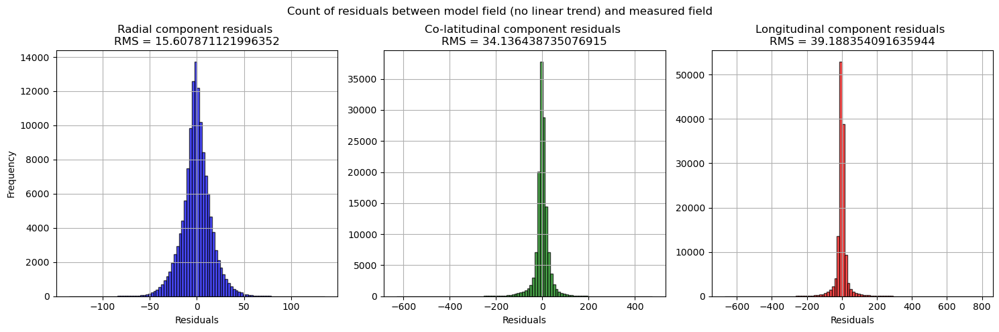

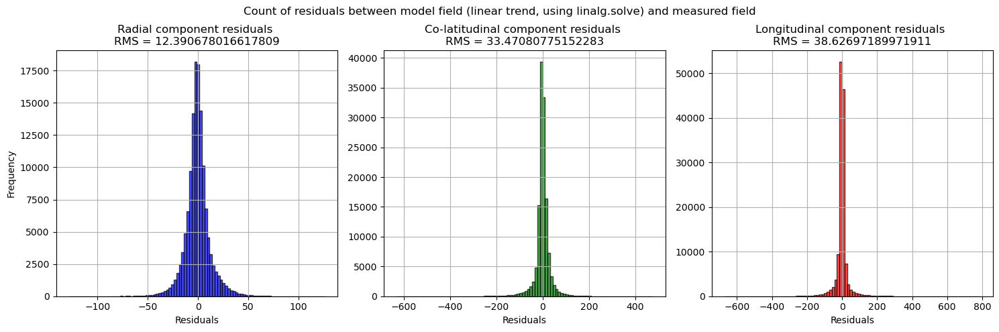

In [16]:
residuals_r = data['B_radius'] - b_pred_radius
residuals_t = data['B_theta'] - b_pred_theta
residuals_p = data['B_phi'] - b_pred_phi




# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_r_static**2))))
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
axs[1].set_title('Co-latitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_t_static**2))))
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
axs[2].set_title('Longitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_p_static**2))))
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Count of residuals between model field (no linear trend) and measured field')

plt.show()


# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_r**2))))
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
axs[1].set_title('Co-latitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_t**2))))
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
axs[2].set_title('Longitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_p**2))))
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Count of residuals between model field (linear trend, using linalg.solve) and measured field')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

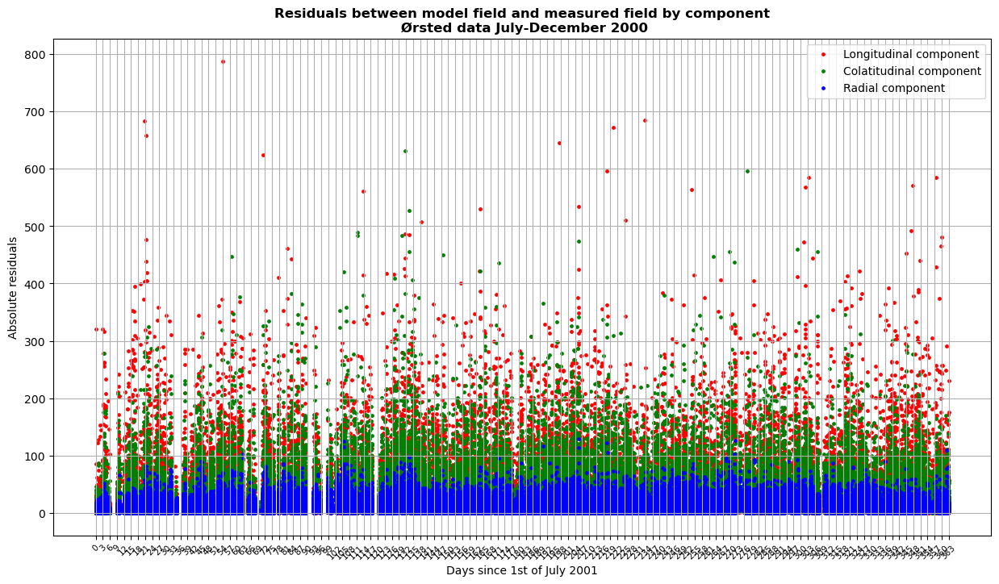

In [17]:
no_days_oersted = round(data['time_stamp'].iloc[-1] - data['time_stamp'].iloc[0])

plt.figure(figsize=(15,8))
plt.scatter(data['time_stamp'], abs(residuals_p), label = 'Longitudinal component', color = 'red', s = 6)
plt.scatter(data['time_stamp'], abs(residuals_t), label = 'Colatitudinal component', color = 'green', s = 6)
plt.scatter(data['time_stamp'], abs(residuals_r), label = 'Radial component', color = 'blue', s = 6)
plt.legend()
plt.grid()
plt.ylabel('Absolute residuals')
tick_positions = np.linspace(data['time_stamp'].iloc[0], data['time_stamp'].iloc[-1], len(range(no_days_oersted)[::3]))
plt.xticks(tick_positions, range(no_days_oersted)[::3], fontsize = 7.5, rotation = 45)
plt.xlabel('Days since 1st of July 2001')
plt.title('Residuals between model field and measured field by component\n Ørsted data July-December 2000', weight = 'bold', fontsize = 12)
plt.show

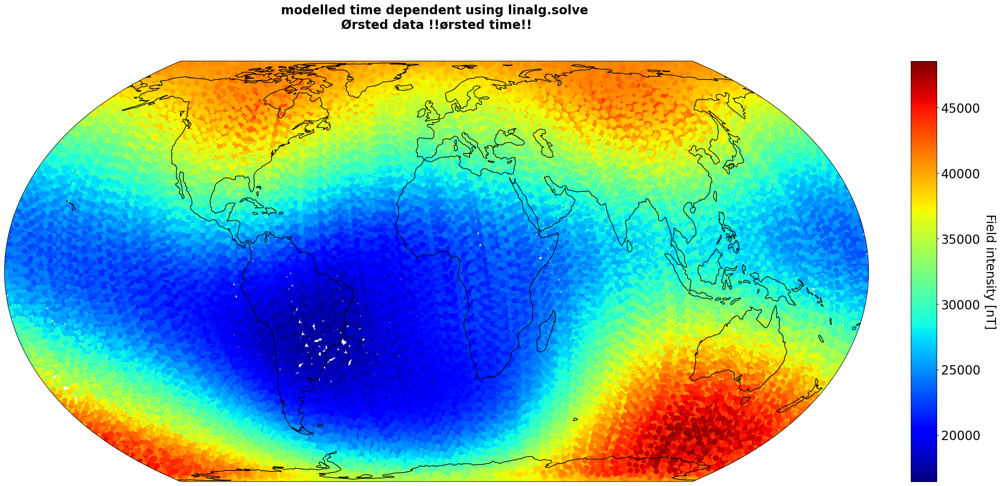

In [18]:
F_pred_time_dep = np.sqrt(b_pred_radius**2 + b_pred_theta**2 +b_pred_phi**2)

plot_map_one(F_pred_time_dep, data['lon'], data['colat'], sat='Ørsted', title='modelled time dependent using linalg.solve', label='Field intensity [nT]', scatter_size=80)

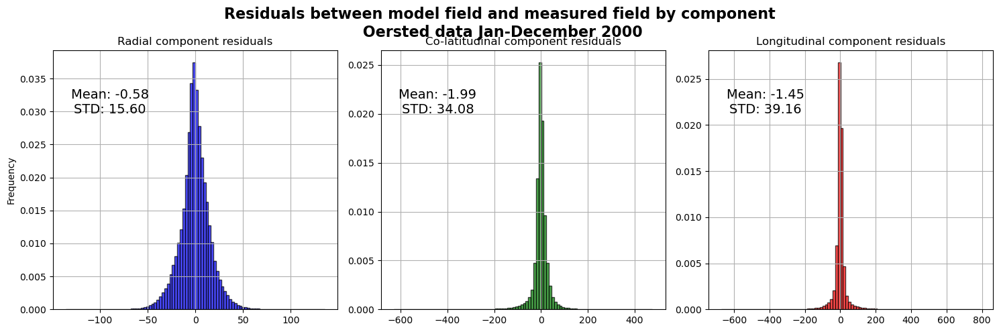

In [19]:
# Calculate mean values
mean_r = np.mean(residuals_r_static)
mean_t = np.mean(residuals_t_static)
mean_p = np.mean(residuals_p_static)

# Calculate standard deviation values
std_r = np.std(residuals_r_static)
std_t = np.std(residuals_t_static)
std_p = np.std(residuals_p_static)

# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # Change to 1 row and 3 columns

# Plot histogram of residuals_r
axs[0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7, density=True)
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals')
axs[0].grid(True)

# # Overlay Gaussian distribution curve
# xmin, xmax = axs[0].get_xlim()
# x = np.linspace(xmin, xmax, 100)
# p = norm.pdf(x, mean_r, std_r)
# axs[0].plot(x, p, 'k', linewidth=2)

# Plot histogram of residuals_t
axs[1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7, density=True)
axs[1].set_title('Co-latitudinal component residuals')
axs[1].grid(True)

# # Overlay Gaussian distribution curve
# xmin, xmax = axs[1].get_xlim()
# x = np.linspace(xmin, xmax, 100)
# p = norm.pdf(x, mean_t, std_t)
# axs[1].plot(x, p, 'k', linewidth=2)

# Plot histogram of residuals_p
axs[2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7, density=True)
axs[2].set_title('Longitudinal component residuals')
axs[2].grid(True)

# # Overlay Gaussian distribution curve
# xmin, xmax = axs[2].get_xlim()
# x = np.linspace(xmin, xmax, 100)
# p = norm.pdf(x, mean_p, std_p)
# axs[2].plot(x, p, 'k', linewidth=2)

# Add mean and std values
for ax, m, std in zip(axs, [mean_r, mean_t, mean_p], [std_r, std_t, std_p]):
    ax.text(0.2, 0.8, f'Mean: {m:.2f}\nSTD: {std:.2f}', transform=ax.transAxes, ha='center', va='center', color='black', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Residuals between model field and measured field by component\n Oersted data Jan-December 2000', weight='bold', fontsize=16)

plt.show()

# Secular variation

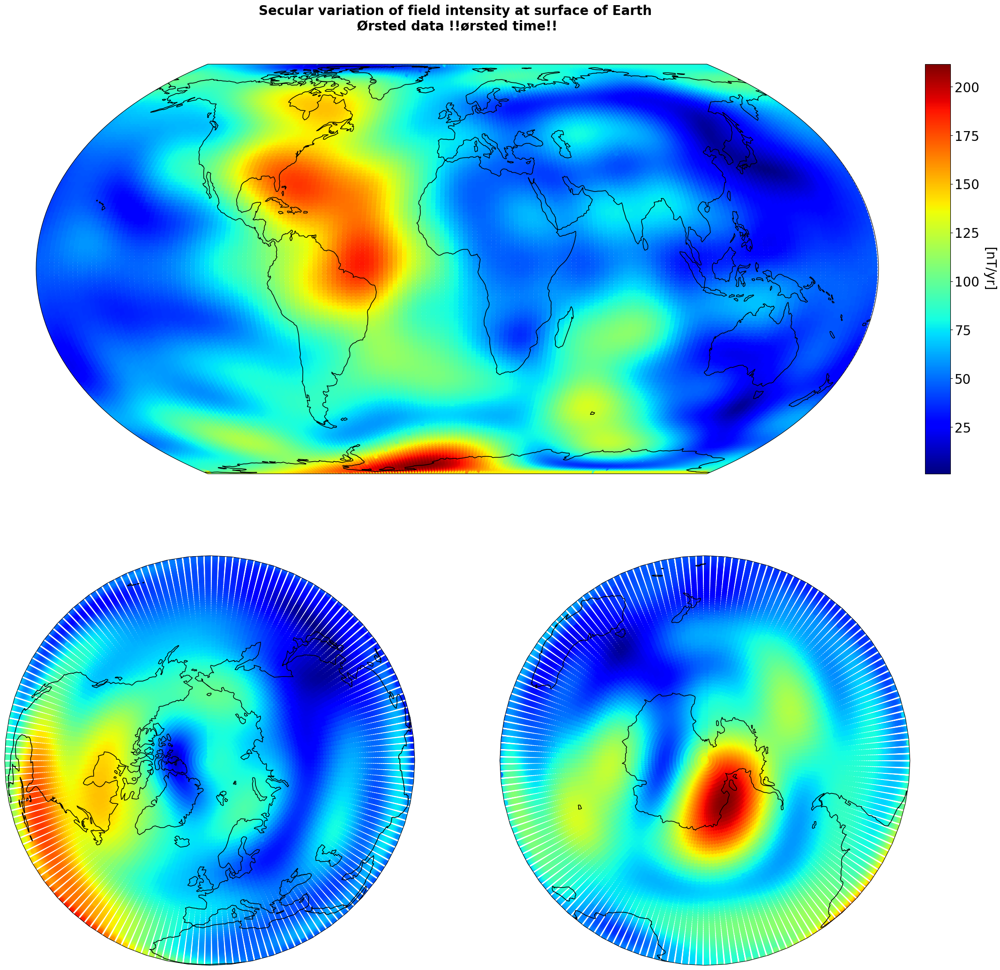

In [20]:
n_int_max = 13

nm_internal = (n_int_max + 1)**2 - 1

Gr, Gt, Gp = do_design(radius_Earth, theta_grid, phi_grid, n_int_max, 0) # Normal design to not have (t-t0)
m = get_gausscoeff_timetrend(data, n_int_max, 1)


b_pred_radius2 = Gr @ m[-(nm_internal):]*365.25
b_pred_theta2 = Gt @ m[-(nm_internal):]*365.25
b_pred_phi2 = Gp @ m[-(nm_internal):]*365.25


F_sec = np.sqrt(b_pred_radius2**2 + b_pred_theta2**2 + b_pred_phi2**2)

plot_map_three(F_sec, phi_grid, theta_grid, 'ørsted', 'Secular variation of field intensity at surface of Earth', '[nT/yr]')

In [21]:
def plot_difference_F(dataframe, r, theta, phi, m, n_int_max, n_ext_max, external_source = False):
    # nm = ((n_int_max + 1)**2 - 1)*2 + (n_ext_max + 1)**2 - 1
    data = dataframe.copy()
    theta_grid = theta.copy()
    phi_grid = phi.copy()

    r = radius_Earth + 450 # need to be variable?

    # m = get_gausscoeff(data, n_int_max, n_ext_max)

    nm_internal = (n_int_max + 1)**2 - 1

    if external_source: print('External source not implemented yet')
    else:
        Gr_start, Gt_start, Gp_start = do_design_timetrend(r, theta_grid, phi_grid, n_int_max, 0, np.tile(min(data['time_grad'].values), len(theta_grid)))
        Gr_end, Gt_end, Gp_end = do_design_timetrend(r, theta_grid, phi_grid, n_int_max, 0, np.tile(max(data['time_grad'].values), len(theta_grid)))
        br_start = Gr_start @ np.hstack((m[:nm_internal], m[-nm_internal:])) # Only internal parameters
        bt_start = Gt_start @ np.hstack((m[:nm_internal], m[-nm_internal:]))
        bp_start = Gp_start @ np.hstack((m[:nm_internal], m[-nm_internal:]))

        F_start = np.sqrt(br_start**2 + bt_start**2 + bp_start**2)

        br_end = Gr_end @ np.hstack((m[:nm_internal], m[-nm_internal:]))
        bt_end = Gt_end @ np.hstack((m[:nm_internal], m[-nm_internal:]))
        bp_end = Gp_end @ np.hstack((m[:nm_internal], m[-nm_internal:]))

        F_end = np.sqrt(br_end**2 + bt_end**2 + bp_end**2)

        F = F_end - F_start

        plot_map_one(F, phi_grid, theta_grid, 'oersted', 'Difference in field intensity (F(end)-F(start)) at 450km altitude \nn = ' + str(n_int_max), '[nT]')
    
    return



def plot_power_spectrum(m, n_int_max, r_eval, static = True):
    nm_internal = (n_int_max + 1)**2 - 1

    if static:
        plt.semilogy(range(n_int_max), power_spectrum(m[:nm_internal], radius = r_eval))
        plt.scatter(range(n_int_max), power_spectrum(m[:nm_internal], radius = r_eval))
        plt.title('Power spectrum of internal, static coefficients truncated at n = ' + str(n_int_max) + '\n r = ' + str(r_eval) + 'km')
        if r_eval == radius_Earth:
            plt.ylabel('Wn(a) [nT^2]')
        elif r_eval == radius_Earth + 450:
            plt.ylabel('Wn(a + 450km) [nT^2]')
        elif r_eval == radius_CMB:
            plt.ylabel('Wn(CMB) [nT^2]')
        else: 
            plt.ylabel('Wn(' + str(r_eval) + 'km) [nT^2]')

    else:
        plt.semilogy(range(n_int_max), power_spectrum(m[-nm_internal:]*365.25, radius = r_eval))
        plt.scatter(range(n_int_max), power_spectrum(m[-nm_internal:]*365.25, radius = r_eval))
        plt.title('Power spectrum of secular coefficients truncated at n = ' + str(n_int_max) + '\n r = ' + str(r_eval) + 'km')
        if r_eval == radius_Earth:
            plt.ylabel('Wn(a) [nT^2/yr]')
        elif r_eval == radius_Earth + 450:
            plt.ylabel('Wn(a + 450km) [nT^2/yr]')
        elif r_eval == radius_CMB:
            plt.ylabel('Wn(CMB) [nT^2/yr]')
        else: 
            plt.ylabel('Wn(' + str(r_eval) + 'km) [nT^2/yr]')

 
    plt.xlabel('n')
    plt.xticks(range(n_int_max), range(n_int_max + 1)[1:])
    plt.grid()
    plt.show()

    return

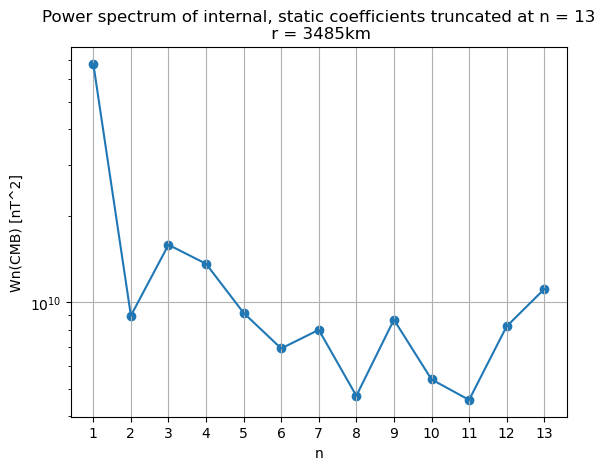

In [22]:
plot_power_spectrum(m, n_int_max, radius_CMB, static = True)

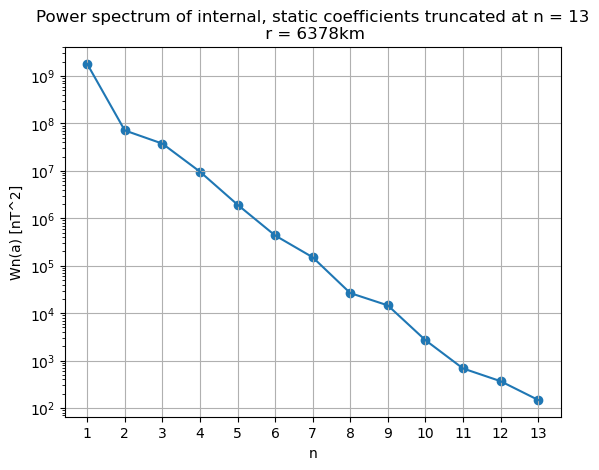

In [23]:
plot_power_spectrum(m, n_int_max, radius_Earth, static = True)

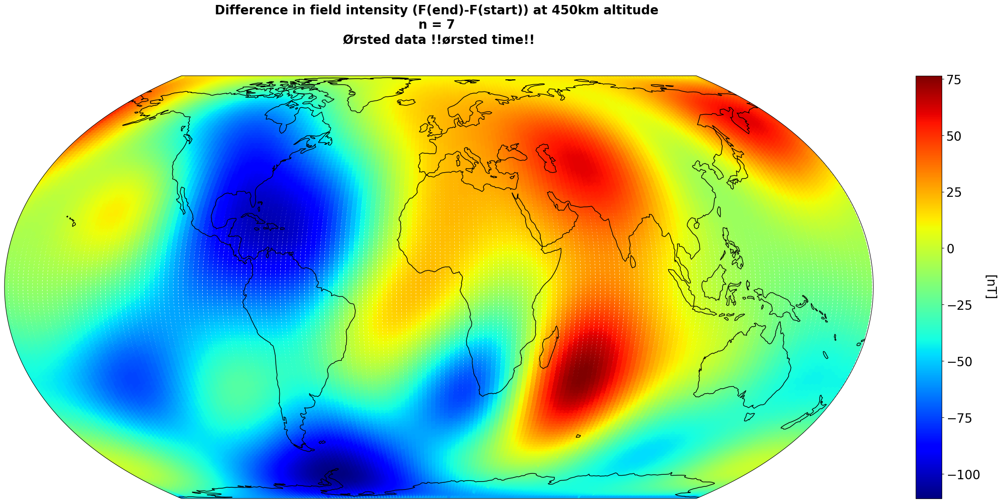

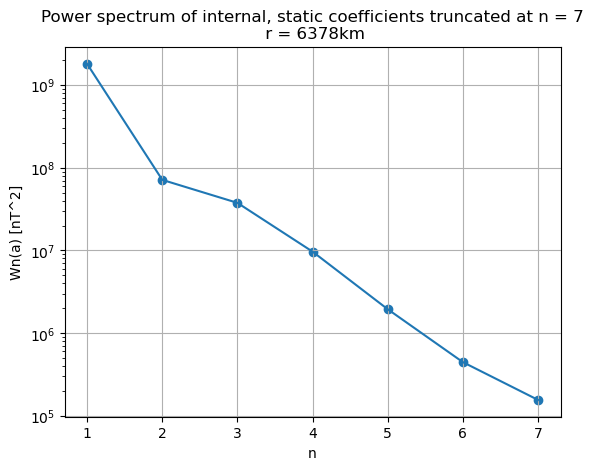

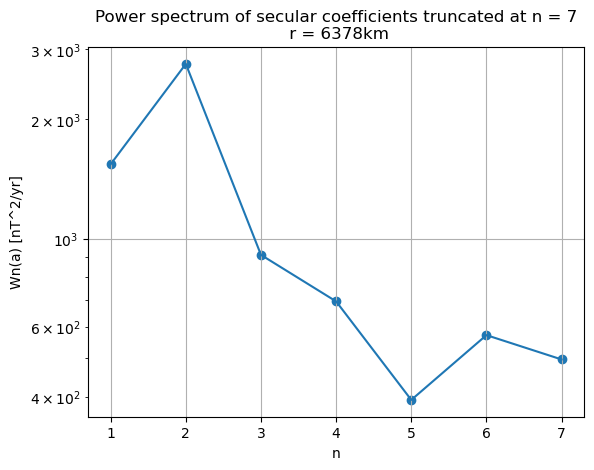

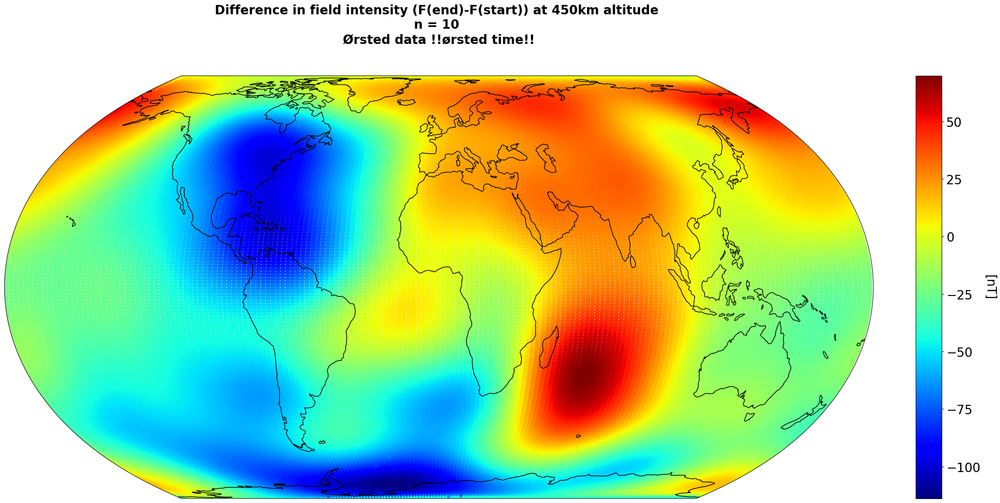

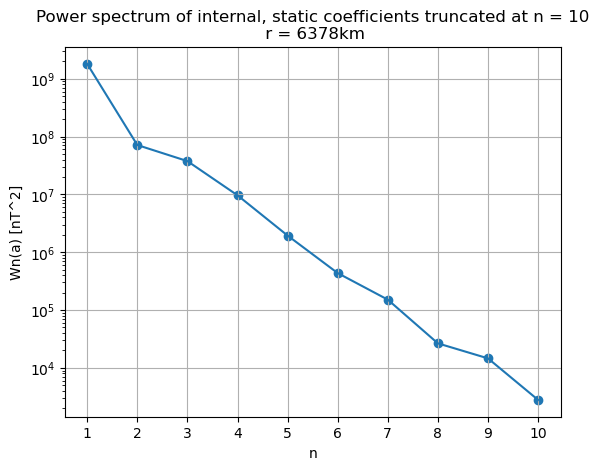

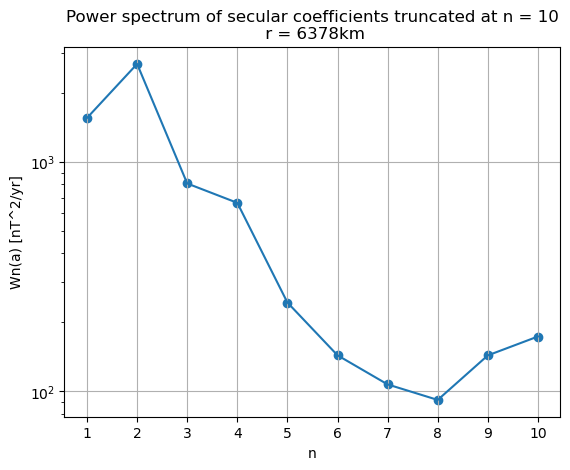

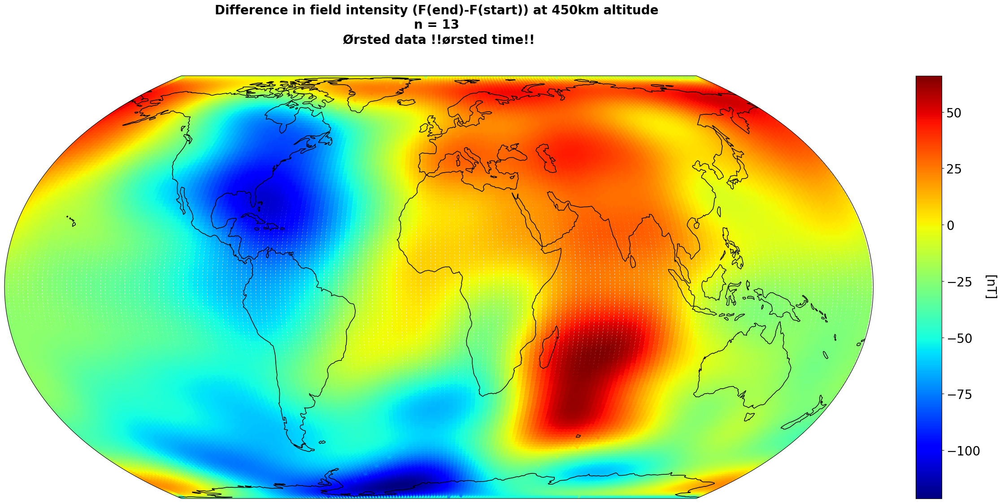

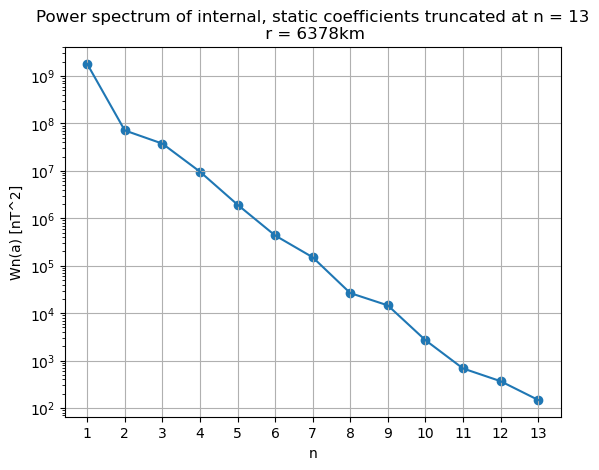

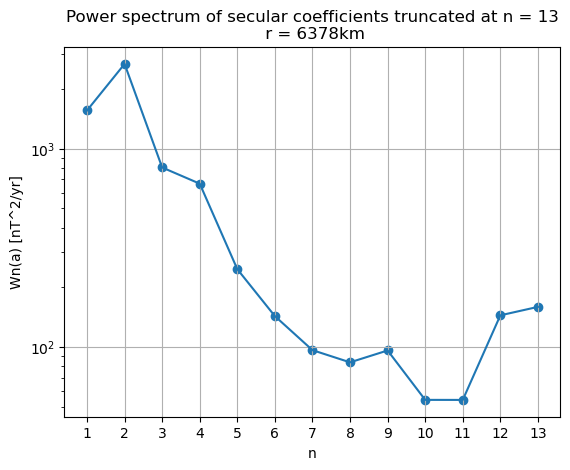

In [24]:
n_max_investigate = [7, 10, 13]

for n_int_max in n_max_investigate:
    m = get_gausscoeff_timetrend(data, n_int_max, n_ext_max)

    plot_difference_F(data, (radius_Earth + 450), theta_grid, phi_grid, m, n_int_max, n_ext_max)
    plot_power_spectrum(m, n_int_max, radius_Earth)
    plot_power_spectrum(m, n_int_max, radius_Earth, static=False)

In [25]:
timestamp(t0)

numpy.datetime64('2001-07-01T09:30:43.763040')

In [26]:
data['time_grad']

0        -182.389348
1        -182.388612
2        -182.387876
3        -182.387141
4        -182.386405
             ...    
135243    182.315828
135244    182.316590
135245    182.317575
135246    182.318520
135247    182.319479
Name: time_grad, Length: 135248, dtype: float64